## **Notebook #6**
## Simple Recurrent Neural Network, Linear Predictor, MLP, ESN and LSTM for multi-step time series prediction.
**Professor:** Fernando J. Von Zuben <br>
**Aluno(a):** Arthur Felipe dos Santos Fernandes


In [4]:
# Loading all the relevant libraries
from pandas import read_csv
from pandas import DataFrame
import numpy as np
import pandas as pd
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense, SimpleRNN, LSTM, GRU
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import math
import matplotlib.pyplot as plt

## **A base [unemployment rate] foi baixada no [link](https://fred.stlouisfed.org/series/UNRATE).**

In [5]:
# Structuring the dataset from a single time series, scaling and spliting into training / testing
def get_train_test(dataset, split_percent, time_steps, horizon):
    df = read_csv(dataset, usecols=[1], engine='python')
    data = np.array(df.values.astype('float32'))
    scaler = MinMaxScaler(feature_range=(0, 1))
    # There is a kind of data leakage in the next command
    data = scaler.fit_transform(data).flatten()
    n = len(data)
    df = DataFrame()
    for i in range(0,time_steps):
      df['t-' + str(time_steps-i-1)] = [data[j] for j in range(i, (len(data)-horizon-time_steps+i+1))]
    for i in range(1,horizon+1):
      df['t+' + str(i)] = [data[j] for j in range(time_steps+i-1, (len(data)-horizon+i))]
    df1 = df.copy()
    for i in range(1,horizon+1):
      df1 = df1.drop(['t+' + str(i)], axis = 1)
    print(df1)
    dataX = np.array(df1)
    df2 = df['t+1']
    for i in range(2,horizon+1):
      df2 = pd.concat([df2, df['t+' + str(i)]], axis=1)
    datay = np.array(df2)
    # Point for splitting data into train and test
    split = int(n*split_percent)
    X = dataX[range(split),:]
    y = datay[range(split)]
    Xt = dataX[split:,:]
    yt = datay[split:]
    return X, y, Xt, yt

time_steps = 11
horizon = 3
# Here you will decide which dataset to consider.
dataset = get_train_test('unemployment_rate.csv', 0.8, time_steps, horizon)
title = ['unemployment_rate', 'monthly_sunspot']

         t-10       t-9       t-8       t-7       t-6       t-5       t-4  \
0    0.073770  0.106557  0.122951  0.114754  0.081967  0.090164  0.090164   
1    0.106557  0.122951  0.114754  0.081967  0.090164  0.090164  0.114754   
2    0.122951  0.114754  0.081967  0.090164  0.090164  0.114754  0.106557   
3    0.114754  0.081967  0.090164  0.090164  0.114754  0.106557  0.098361   
4    0.081967  0.090164  0.090164  0.114754  0.106557  0.098361  0.106557   
..        ...       ...       ...       ...       ...       ...       ...   
873  0.360656  0.344262  0.344262  0.319672  0.303279  0.286885  0.286885   
874  0.344262  0.344262  0.319672  0.303279  0.286885  0.286885  0.270492   
875  0.344262  0.319672  0.303279  0.286885  0.286885  0.270492  0.278689   
876  0.319672  0.303279  0.286885  0.286885  0.270492  0.278689  0.237705   
877  0.303279  0.286885  0.286885  0.270492  0.278689  0.237705  0.221311   

          t-3       t-2       t-1       t-0  
0    0.114754  0.106557  0.09

In [6]:
# Recurrent Neural Networkd]
def create_RNN(X, y, time_steps, horizon):
  model = Sequential()
  model.add(SimpleRNN(units=30, activation='tanh', input_shape=(time_steps,1)))
  model.add(Dense(units=horizon, activation='tanh'))
  model.compile(loss='mean_squared_error', optimizer='adam')
  train_predict = model.fit(X, y, epochs=20, batch_size=1, verbose=2)
  return model

In [7]:
# Linear
def create_Linear(X, y, time_steps, horizon):
  model = LinearRegression()
  train_predict = model.fit(X, y)
  print(model.coef_)
  print(model.intercept_)
  return model

In [8]:
#  Multilayer Perceptron
def create_MLP(X, y, time_steps, horizon):
  model = tf.keras.models.Sequential([
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(80, activation=tf.nn.tanh),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(horizon, activation='linear')
  ])
  model.compile(optimizer='adam', loss='mean_squared_error')
  train_predict = model.fit(X, y, epochs=100)
  model.summary()
  return model

In [9]:
!git clone https://github.com/cknd/pyESN.git
!cp /content/pyESN/pyESN.py .
from pyESN import ESN
def create_ESN(X, y, time_steps, horizon):
  model = ESN(n_inputs = time_steps,
            n_outputs = horizon,
            n_reservoir = 500,
            spectral_radius = 2,
            random_state=42)
  model.fit(X,y)
  return model

fatal: destination path 'pyESN' already exists and is not an empty directory.
'cp' n�o � reconhecido como um comando interno
ou externo, um programa oper�vel ou um arquivo em lotes.


In [10]:
# LSTM
def create_LSTM(X, y, time_steps, horizon):
  X1 = X.reshape(X.shape[0],time_steps,1)
  model=Sequential()
  model.add(LSTM(25,input_shape=(time_steps,1)))
  model.add(Dense(horizon,activation='linear'))
  model.compile(loss='mean_squared_error',optimizer='adam')

  train_predict = model.fit(X1,y,epochs=100,verbose=2)
  print(model.summary())
  return model

In [11]:
def erro(model, X, y, Xt, yt, horizon):
  def print_error(trainY, testY, train_predict, test_predict,i):    
      # Error of predictions
      train_rmse = math.sqrt(mean_squared_error(trainY, train_predict))
      test_rmse = math.sqrt(mean_squared_error(testY, test_predict))
      # Print RMSE
      print('t+%d RMSE train: %.3f RMSE' % (i+1, train_rmse))
      print('t+%d RMSE test: %.3f RMSE' % (i+1, test_rmse))

  # Make predictions
  train_predict = model.predict(X)
  test_predict = model.predict(Xt)

  for i in range(horizon):
    if(horizon == 1):
      y1_pred = train_predict
      y1_pred_t = test_predict
      y1 = y
      y1_t = yt
    elif(horizon > 1):
      y1_pred = train_predict[:,i]
      y1_pred_t = test_predict[:,i]
      y1 = y[:,i]
      y1_t = yt[:,i]
    print_error(y1, y1_t, y1_pred, y1_pred_t,i)
    # Plot the predictions together with the actual values
    
  def plot_result(trainY, testY, train_predict, test_predict,i):
      actual = np.append(trainY, testY)
      predictions = np.append(train_predict, test_predict)
      rows = len(actual)
      print('Predições e valores reais')
      plt.figure(figsize=(30, 6), dpi=300)
      plt.plot(range(rows), actual)
      plt.plot(range(rows), predictions)
      plt.axvline(x=len(trainY), color='r')
      plt.legend(['Actual', 'Predictions'])
      plt.xlabel('Time steps')
      plt.ylabel('Actual and Predicted Values')
      plt.title('t+%d Predition (The Red Line Separates The Training And Test Examples)' % (i+1))
      plt.grid(True)

  for i in range(horizon):
    if(horizon == 1):
      y1_pred = train_predict
      y1_pred_t = test_predict
      y1 = y
      y1_t = yt
    elif(horizon > 1):
      y1_pred = train_predict[:,i]
      y1_pred_t = test_predict[:,i]
      y1 = y[:,i]
      y1_t = yt[:,i]
    plot_result(y1, y1_t, y1_pred, y1_pred_t,i)
    # Plot the prediction error
  def plot_result2(trainY, testY, train_predict, test_predict,i):
      actual = np.append(trainY, testY)
      predictions = np.append(train_predict, test_predict)
      rows = len(actual)
      print('Erro de predição')
      plt.figure(figsize=(30, 6), dpi=300)
      plt.plot(range(rows), actual - predictions)
      plt.axvline(x=len(trainY), color='r')
      plt.xlabel('Time steps')
      plt.ylabel('Actual minus Predicted Values')
      plt.title('t+%d Predition Error (The Red Line Separates The Training And Test Examples)' % (i+1))
      plt.ylim(-0.5, +1.0) # Please, set the interval appropriately, considering all the graphs.
      plt.grid(True)

  for i in range(horizon):
    if(horizon == 1):
      y1_pred = train_predict
      y1_pred_t = test_predict
      y1 = y
      y1_t = yt
    elif(horizon > 1):
      y1_pred = train_predict[:,i]
      y1_pred_t = test_predict[:,i]
      y1 = y[:,i]
      y1_t = yt[:,i]
    plot_result2(y1, y1_t, y1_pred, y1_pred_t,i)

In [12]:
X, y, Xt, yt = dataset
model = [create_RNN(X, y, time_steps, horizon), create_Linear(X, y, time_steps, horizon),
    create_MLP(X, y, time_steps, horizon), create_ESN(X, y, time_steps, horizon),
    create_LSTM(X, y, time_steps, horizon)]

Epoch 1/20
712/712 - 2s - loss: 0.0035 - 2s/epoch - 3ms/step
Epoch 2/20
712/712 - 1s - loss: 0.0012 - 1s/epoch - 1ms/step
Epoch 3/20
712/712 - 1s - loss: 9.7066e-04 - 1s/epoch - 2ms/step
Epoch 4/20
712/712 - 1s - loss: 8.4438e-04 - 1s/epoch - 1ms/step
Epoch 5/20
712/712 - 1s - loss: 7.6187e-04 - 1s/epoch - 2ms/step
Epoch 6/20
712/712 - 1s - loss: 7.3785e-04 - 1s/epoch - 2ms/step
Epoch 7/20
712/712 - 1s - loss: 7.1452e-04 - 928ms/epoch - 1ms/step
Epoch 8/20
712/712 - 1s - loss: 7.4467e-04 - 886ms/epoch - 1ms/step
Epoch 9/20
712/712 - 1s - loss: 7.0077e-04 - 922ms/epoch - 1ms/step
Epoch 10/20
712/712 - 1s - loss: 6.8460e-04 - 1s/epoch - 2ms/step
Epoch 11/20
712/712 - 1s - loss: 6.8749e-04 - 1s/epoch - 2ms/step
Epoch 12/20
712/712 - 1s - loss: 6.9116e-04 - 863ms/epoch - 1ms/step
Epoch 13/20
712/712 - 1s - loss: 6.8919e-04 - 884ms/epoch - 1ms/step
Epoch 14/20
712/712 - 1s - loss: 6.8888e-04 - 886ms/epoch - 1ms/step
Epoch 15/20
712/712 - 1s - loss: 6.7920e-04 - 901ms/epoch - 1ms/step
Epoch 

In [13]:
def quadro_geral(index_modelo):
    X, y, Xt, yt = dataset
    erro(model[index_modelo], X, y, Xt, yt, horizon)

## Modelo RNN

6/6 [==============================] - 0s 1ms/step
t+1 RMSE train: 0.017 RMSE
t+1 RMSE test: 0.069 RMSE
t+2 RMSE train: 0.023 RMSE
t+2 RMSE test: 0.096 RMSE
t+3 RMSE train: 0.030 RMSE
t+3 RMSE test: 0.114 RMSE
Predições e valores reais
Predições e valores reais
Predições e valores reais
Erro de predição
Erro de predição
Erro de predição


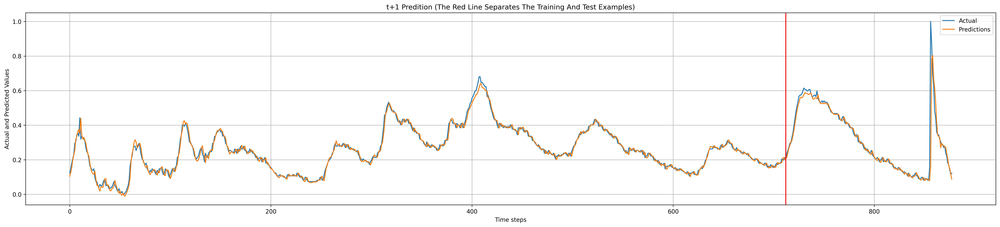

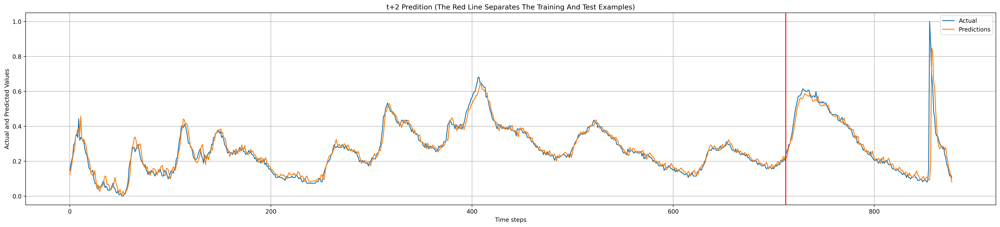

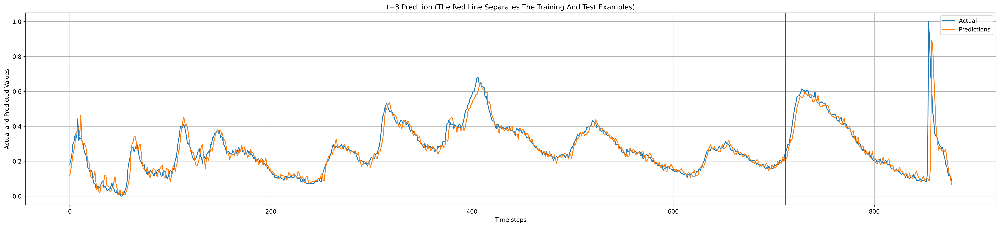

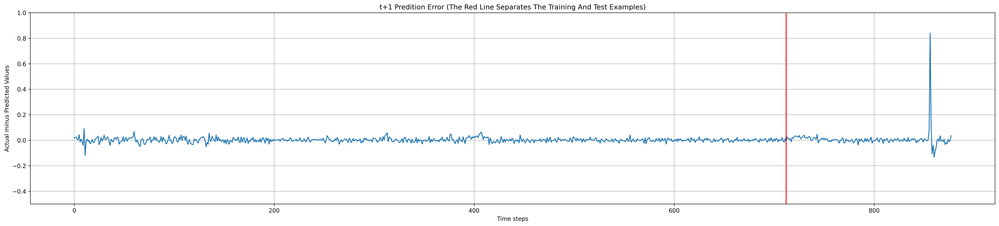

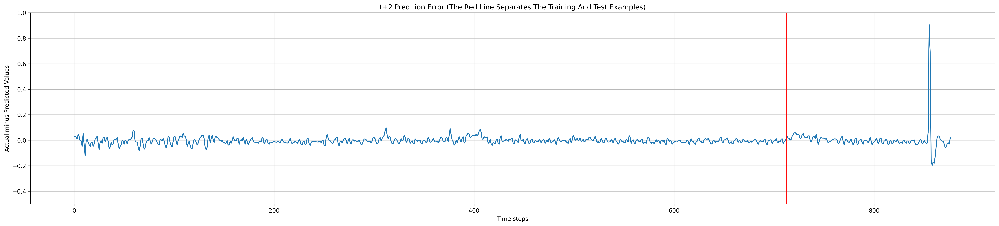

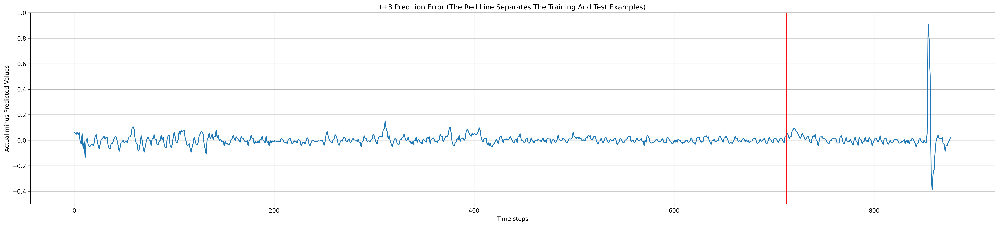

In [14]:
quadro_geral(0)

## Modelo Linear

t+1 RMSE train: 0.016 RMSE
t+1 RMSE test: 0.077 RMSE
t+2 RMSE train: 0.022 RMSE
t+2 RMSE test: 0.115 RMSE
t+3 RMSE train: 0.029 RMSE
t+3 RMSE test: 0.142 RMSE
Predições e valores reais
Predições e valores reais
Predições e valores reais
Erro de predição
Erro de predição
Erro de predição


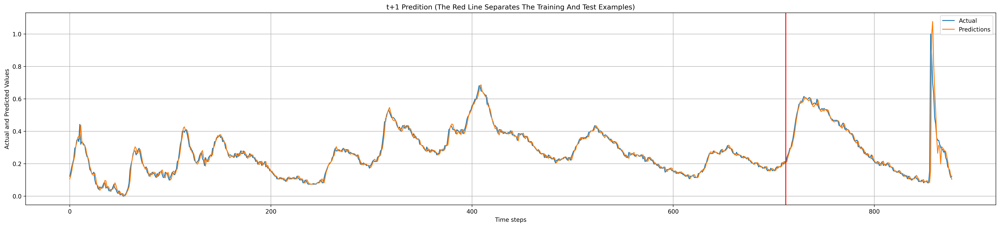

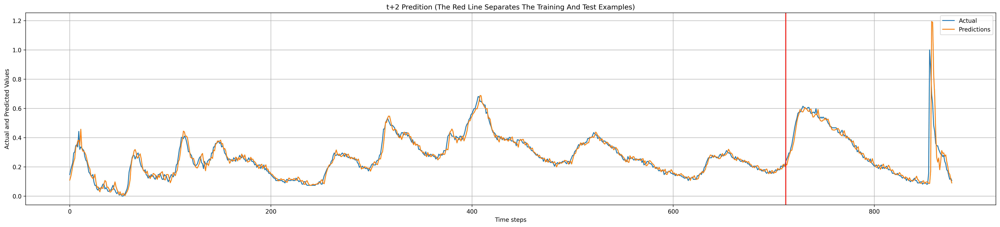

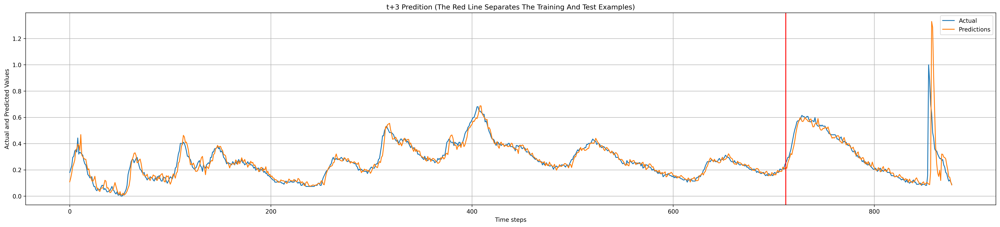

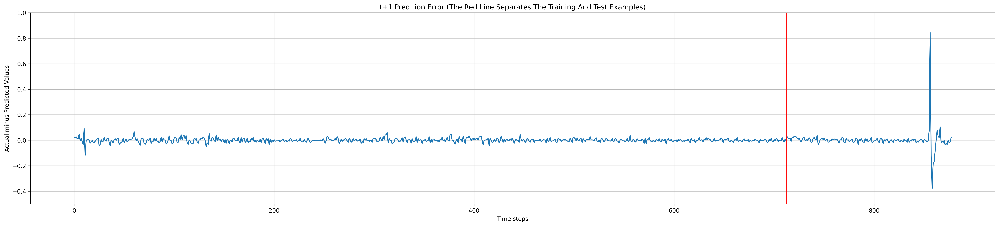

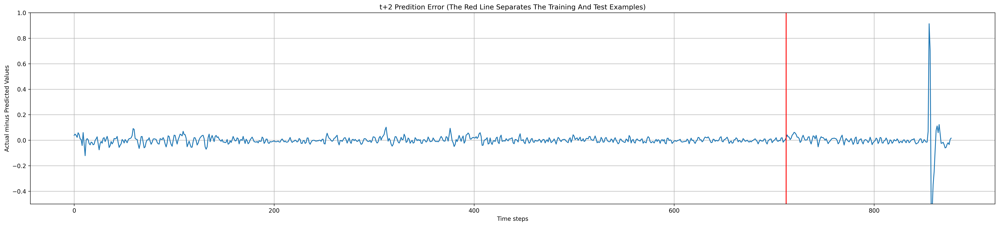

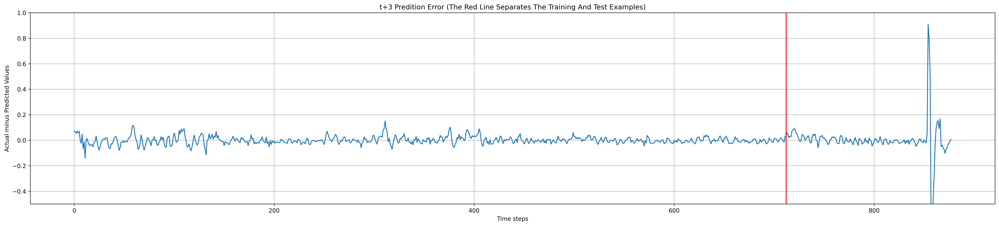

In [15]:
quadro_geral(1)

## Modelo MLP

6/6 [==============================] - 0s 682us/step
t+1 RMSE train: 0.020 RMSE
t+1 RMSE test: 0.084 RMSE
t+2 RMSE train: 0.024 RMSE
t+2 RMSE test: 0.112 RMSE
t+3 RMSE train: 0.031 RMSE
t+3 RMSE test: 0.138 RMSE
Predições e valores reais
Predições e valores reais
Predições e valores reais
Erro de predição
Erro de predição
Erro de predição


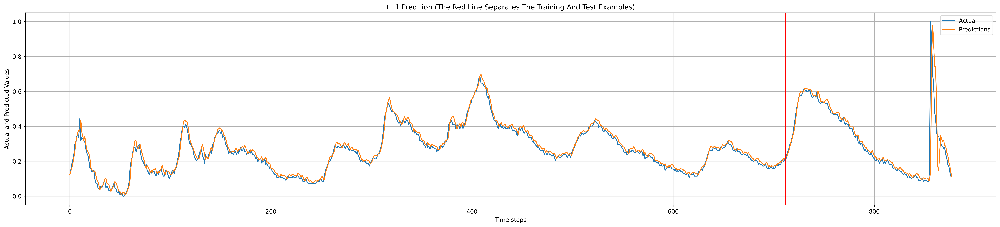

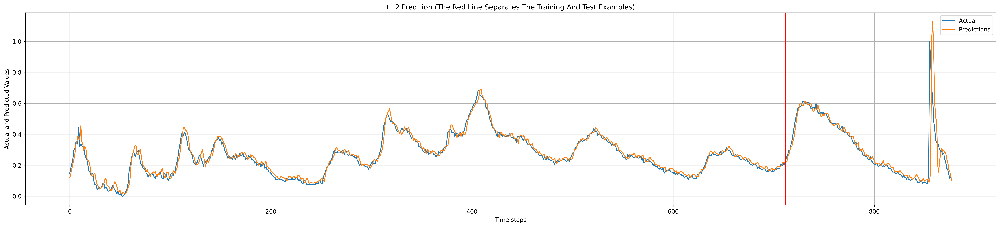

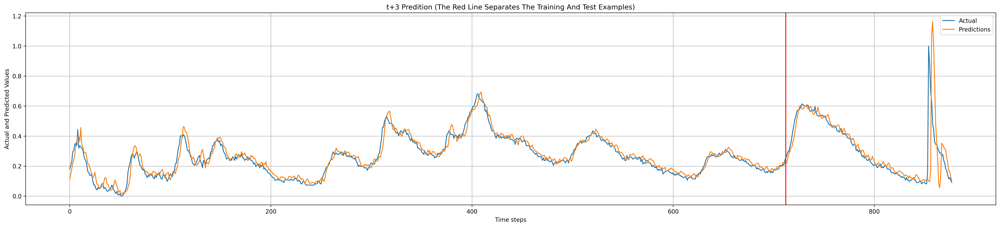

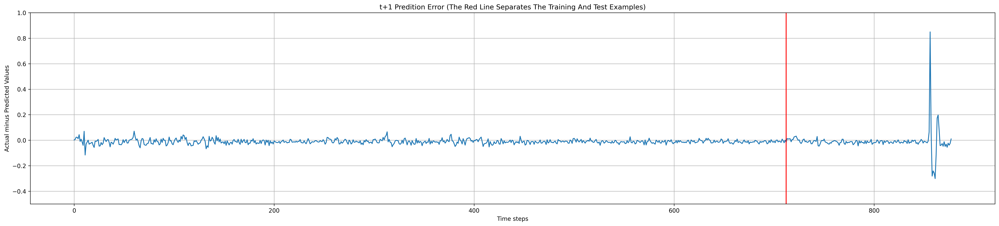

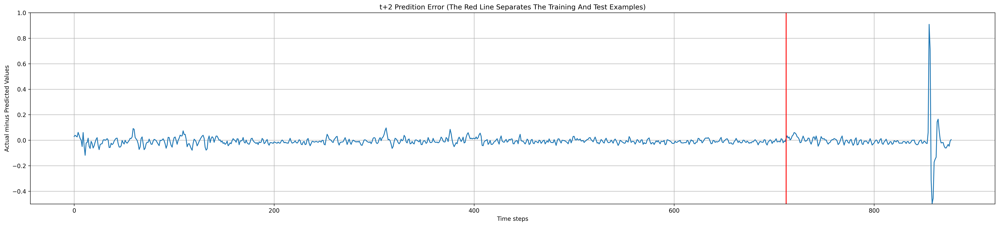

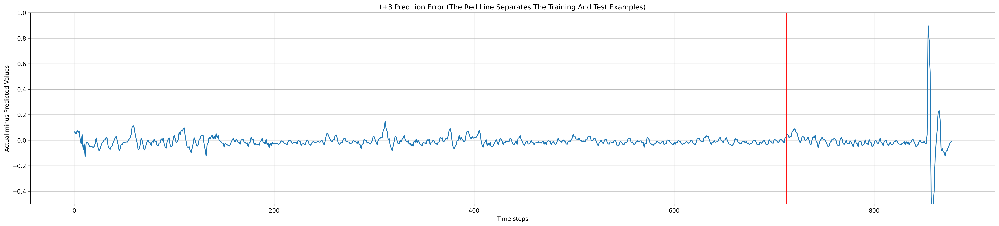

In [16]:
quadro_geral(2)

## Modelo ESN

t+1 RMSE train: 0.038 RMSE
t+1 RMSE test: 0.087 RMSE
t+2 RMSE train: 0.046 RMSE
t+2 RMSE test: 0.109 RMSE
t+3 RMSE train: 0.061 RMSE
t+3 RMSE test: 0.130 RMSE
Predições e valores reais
Predições e valores reais
Predições e valores reais
Erro de predição
Erro de predição
Erro de predição


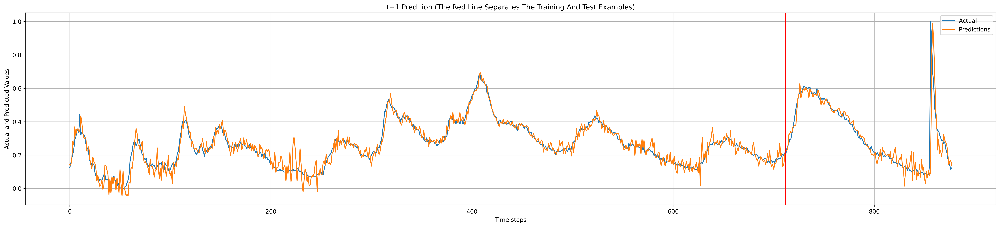

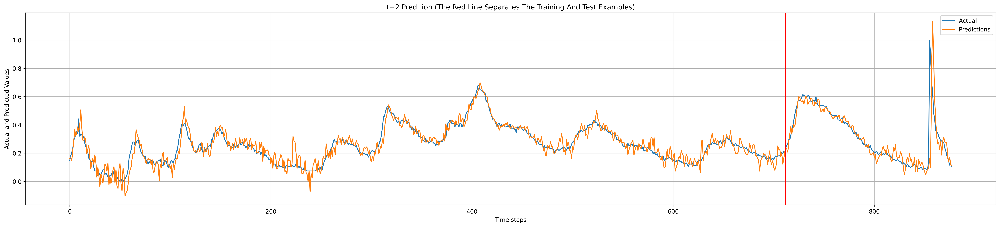

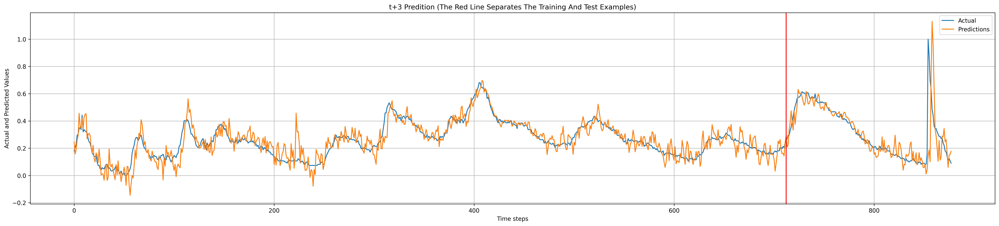

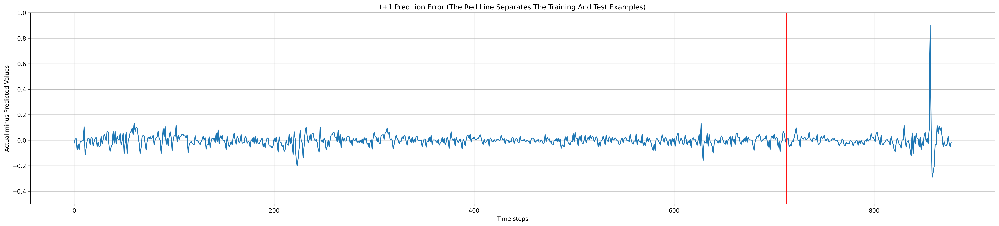

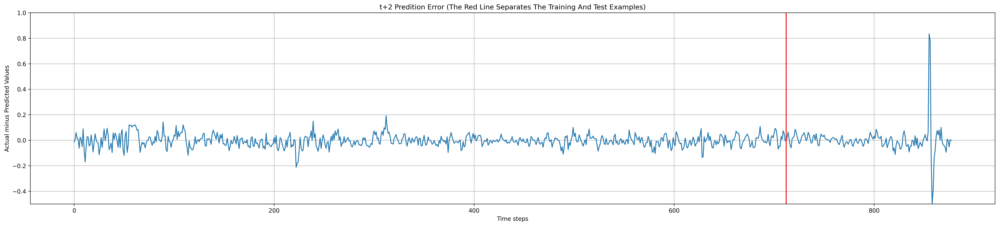

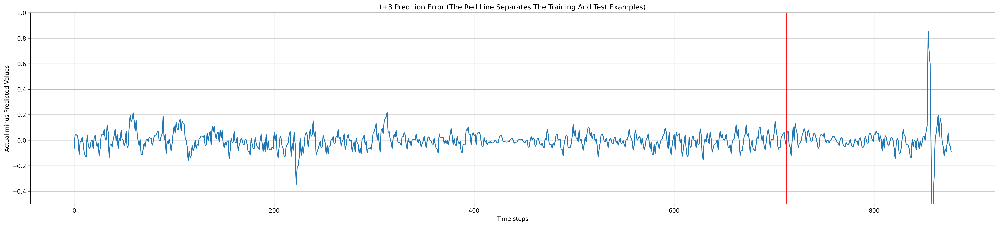

In [17]:
quadro_geral(3)

## Modelo LSTM

6/6 [==============================] - 0s 2ms/step
t+1 RMSE train: 0.019 RMSE
t+1 RMSE test: 0.089 RMSE
t+2 RMSE train: 0.024 RMSE
t+2 RMSE test: 0.118 RMSE
t+3 RMSE train: 0.032 RMSE
t+3 RMSE test: 0.135 RMSE
Predições e valores reais
Predições e valores reais
Predições e valores reais
Erro de predição
Erro de predição
Erro de predição


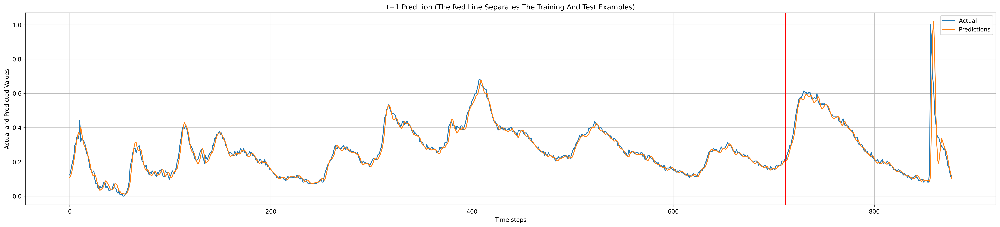

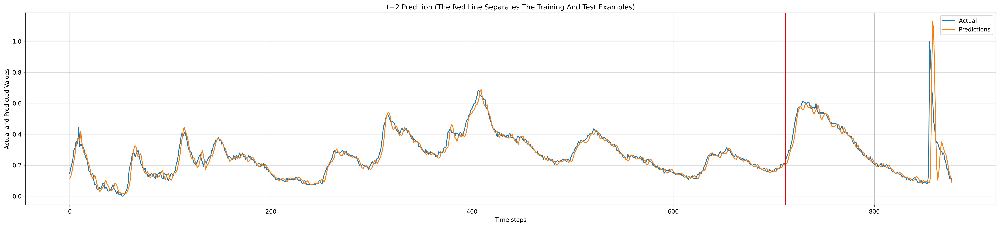

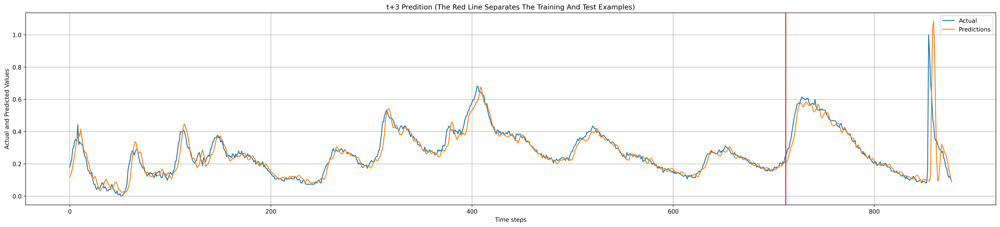

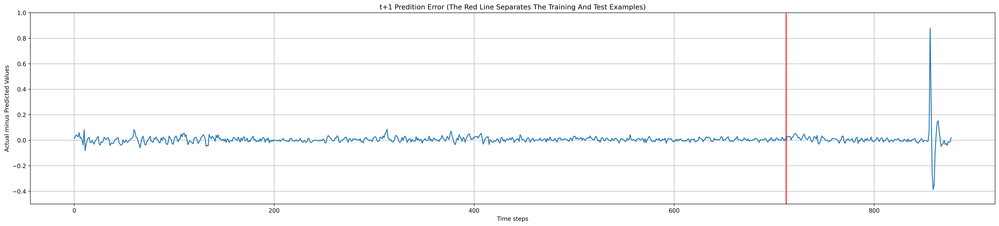

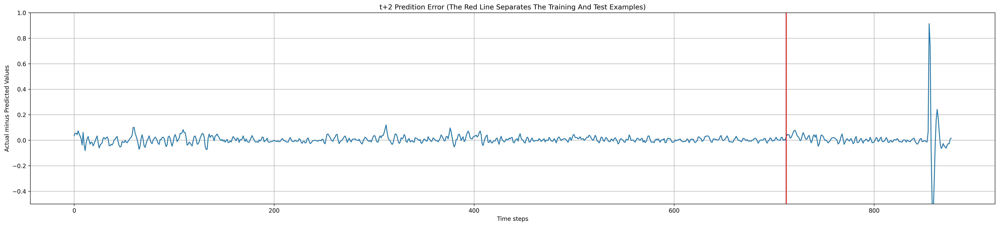

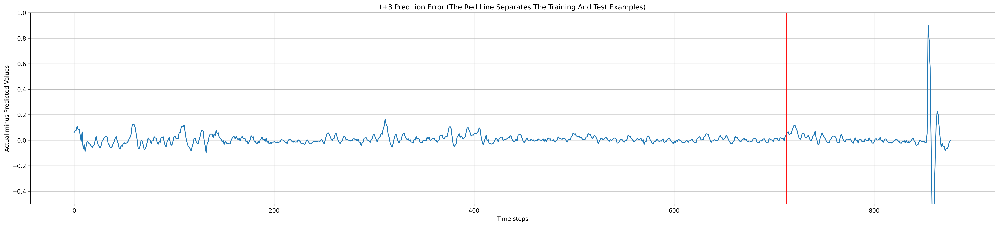

In [18]:
quadro_geral(4)

In [19]:
model = model[0]
# Meaningful only for the simple RNN model (not for LP, MLP, ESN or LSTM)
wx = model.get_weights()[0]
wh = model.get_weights()[1]
bh = model.get_weights()[2]
wy = model.get_weights()[3]
by = model.get_weights()[4]
print(wx.shape)
print(wh.shape)
print(bh.shape)
print(wy.shape)
print(by.shape)

(1, 30)
(30, 30)
(30,)
(30, 3)
(3,)


a. A variável time_steps determina quantos estados passados serão utilizados para a previsão, de u(t) até u(t - time_steps). Enquanto que a variável horizon representa o horizonte de previsão, até quantos horizon passos a frente serão previstos

b. Ao invés de trabalharmos com uma rede recorrente diretamente, expandimos esta em várias camadas feedfoward com pesos compartilhados, com isso, alimentamos a rede com a entrada x_t e uma previsão inicial (zero neste caso) e a previsão da saída é então usada junto com a entrada x_{t+1}, e assim sucessivamente até utilizar as horizon camadas recorrentes. A entrada é um recorte da série temporal com time_steps (11) elementos, seguida por uma camada recorrente que possui 30 neurônios e finalizando com uma camada densa com horizon (3) neurônios, wx se refere aos pesos da camada recorrente que pondera a série temporal, wh se refere aos pesos da camada recorrente que ponderam a própria saída (atuam sobre a recorrência), bh é o bias correspondente a camada de recorrência da rede, wy contem os pesos que multiplicam a saída da camada recorrente para a etapa de predição e by que é o bias associado à camada de saída

c. preditores recorrentes utilizam o valor de time_steps, enquanto que as redes não recorrentes ignoram essa informação. Isso faz com que os preditores recorrentes interpretem a série com maior eficácia

e. Simple RNN apresentou as menores RMSE no banco de dados 'unemployment rate.csv', enquanto que o modelo linear apresentou menor RMSE no banco de dados 'sunspot.csv'. Ambos os modelos atingiram o menor RMSE em todos as previsões de k-passos à frente (+1, +2, +3)